In [14]:
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np



In [18]:
#df = pd.read_csv(r"C:\Users\hwilson23\Documents\GitHub\collagen_3D_multimetric-main\finalcollapsed_dataframe_byslice.csv")
df = pd.read_csv(r"C:\Users\hwilson23\Documents\GitHub\collagen_3D_multimetric-main\finalcollapsed_dataframe_byslice_n2.csv")
#filter/adjust dataframe
#print(df.columns.values)

df['gel_type'] = df['type_inf2h'].map({'shg': 0, 'flu': 1})
df['gel_concen'] = df['concentration_denth'].map({'1mgml':1, '2mgml':2, '3mgml':3})
#df = df.drop(['TotalImageArea','z_depth_HistLEN','concentration_corrp','TotalImageArea','distance3d_indnc','neighbor3d_entro','bin_num3d_denth','roi_senth','type_autoc'],axis=1)
df = df.drop(['TotalImageArea','z_depth_HistWID','concentration_denth','TotalImageArea','distance3d_maxpr','neighbor3d_corrp','bin_num3d_cprom','roi_maxpr','type_inf2h'],axis=1)
##reduce slices

df = df[df['slice']%5==0]
print(len(df))

162


mean_HistANG         median_HistANG            0.921327
mean_HistWID         median_HistWID            0.920933
median_HistANG       mean_HistANG              0.921327
median_HistWID       mean_HistWID              0.920933
Area (microns^2)     Total Length (microns)    0.996724
                                                 ...   
texture3d_std_sosvh  texture3d_std_savgh       0.949437
                     texture3d_std_svarh       0.932913
texture3d_std_svarh  texture3d_std_autoc       0.933813
                     texture3d_std_savgh       0.933832
                     texture3d_std_sosvh       0.932913
Length: 446, dtype: float64


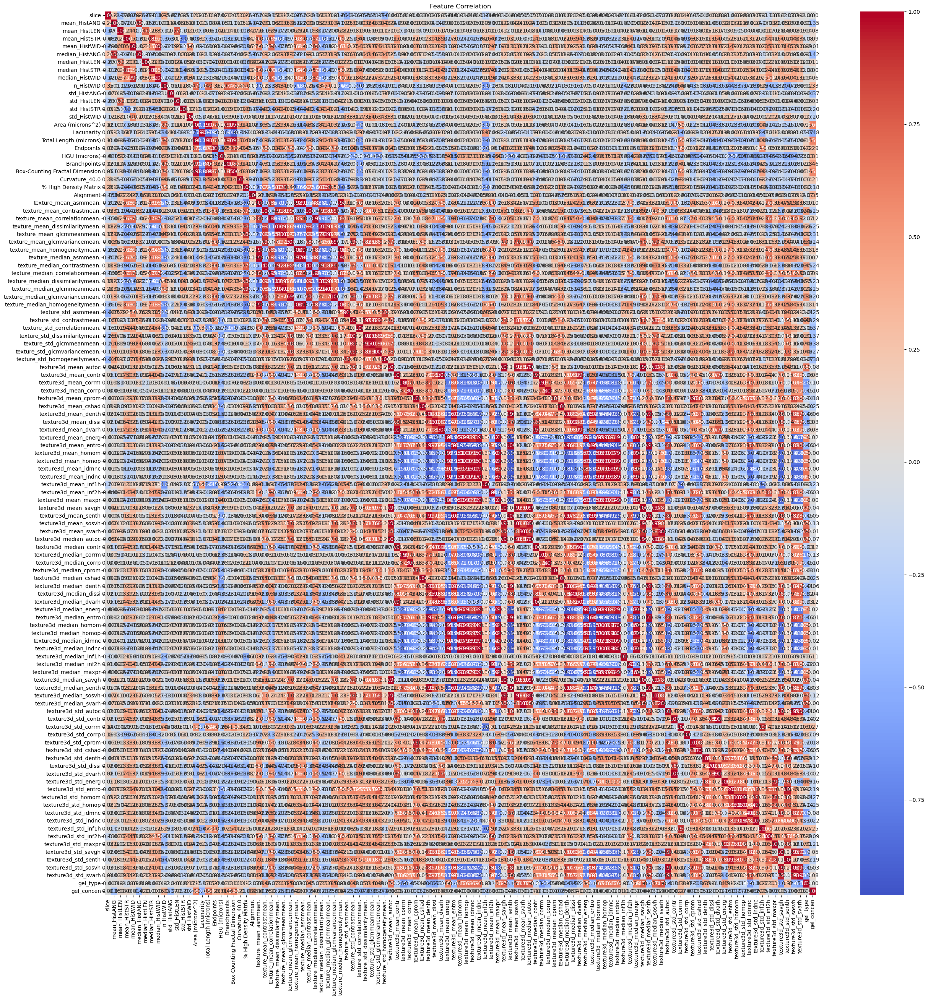

In [19]:
corr = df.corr(numeric_only=True)
corrpairs = corr.unstack()
corrpairs = corrpairs[corrpairs!=1]
print(corrpairs[(corrpairs > 0.9) | (corrpairs < -0.9)])
#print(corr[(corr > 0.9) | (corr < -0.9)])

plt.figure(figsize=(30, 30))
sns.heatmap(corr, annot=True, fmt = ".2f", cmap="coolwarm", center=0)
plt.title("Feature Correlation")
plt.show()


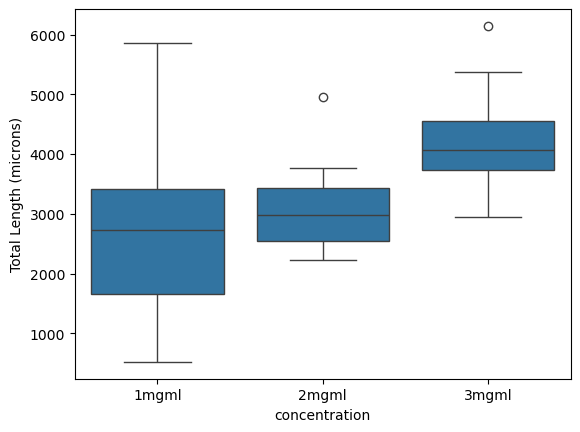

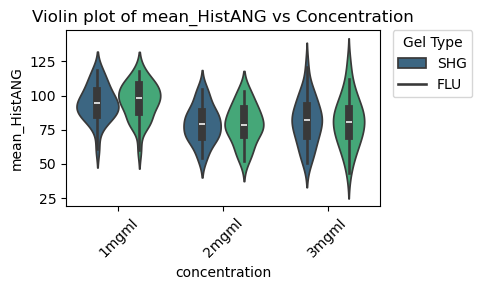

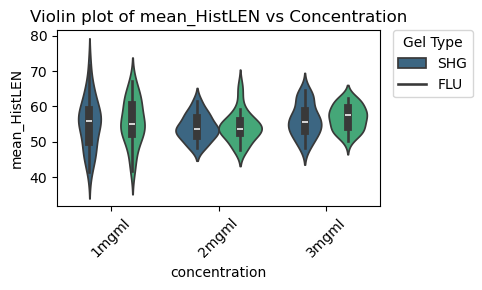

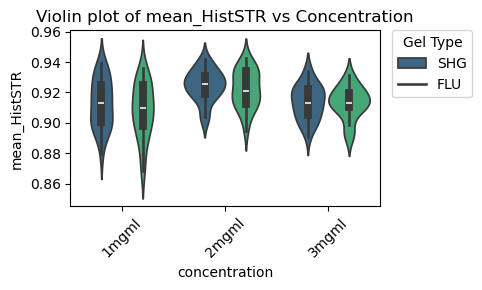

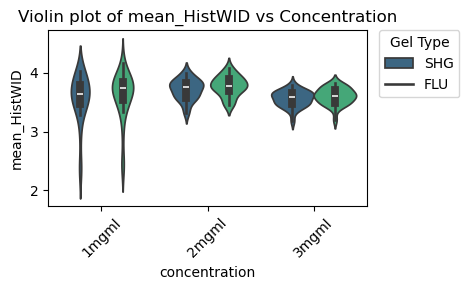

...

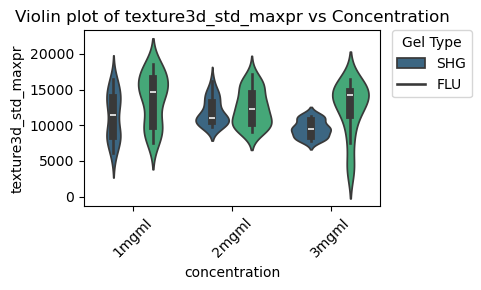

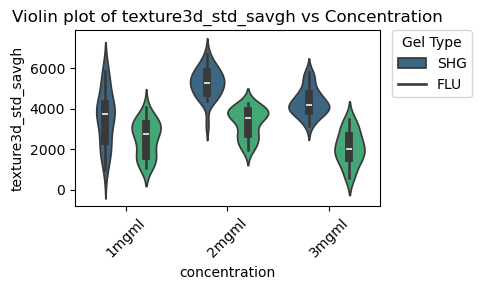

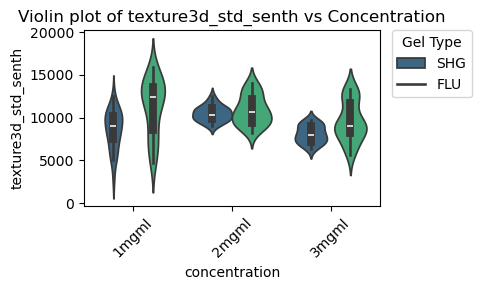

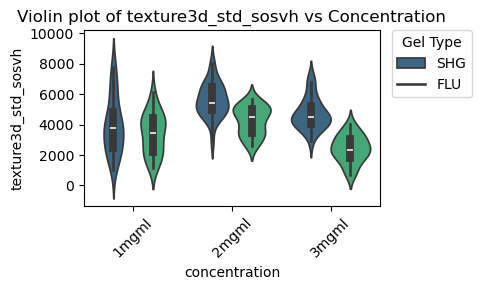

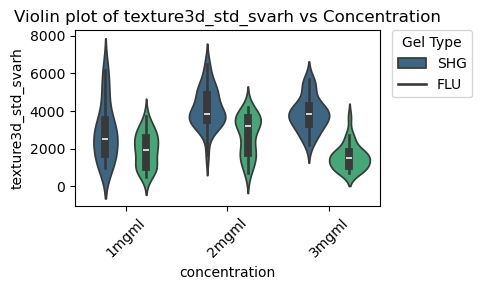

In [21]:
df["concentration"] = df["image_name"].str.extract(r"(\d+mgml)")
#sns.boxplot(data=df, x="concentration", y="total_fibers_HistLEN")

sns.boxplot(data=df, x="concentration", y="Total Length (microns)")

# Get all numeric columns except concentration and gel_type
numeric_cols = df.select_dtypes(include=[np.number]).columns
exclude_cols = ['concentration', 'gel_type', 'gel_concen', 'slice']
plot_cols = [col for col in numeric_cols if col not in exclude_cols]

# Create scatterplots for each column vs concentration, colored by gel_type
for col in plot_cols:
    plt.figure(figsize=(4, 3))
    sns.violinplot(data=df, x="concentration", y=col, hue="gel_type", palette="viridis")
    plt.title(f"Violin plot of {col} vs Concentration")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.legend(title="Gel Type", labels=["SHG", "FLU"], bbox_to_anchor=(1.04, 1), borderaxespad=0)
    plt.show()